# From Quality control to Clustering for day 11 samples

package loading

In [1]:
library(ggplot2)
library(cowplot)
library(dplyr)
library(scran)
library(biomaRt)
library(tibble)
library(AnnotationHub)
library(patchwork)
library(SingleR)
library(Seurat)
library(harmony)
library(SeuratData)
library(magrittr)
library(SeuratWrappers)
library(celldex)
library(scuttle)
library(scRNAseq)
library(DoubletFinder)

Warning message:
“le package ‘ggplot2’ a été compilé avec la version R 4.1.3”
Warning message:
“le package ‘dplyr’ a été compilé avec la version R 4.1.3”

Attachement du package : ‘dplyr’


Les objets suivants sont masqués depuis ‘package:stats’:

    filter, lag


Les objets suivants sont masqués depuis ‘package:base’:

    intersect, setdiff, setequal, union


Le chargement a nécessité le package : SingleCellExperiment

Le chargement a nécessité le package : SummarizedExperiment

Le chargement a nécessité le package : MatrixGenerics

Le chargement a nécessité le package : matrixStats

Warning message:
“le package ‘matrixStats’ a été compilé avec la version R 4.1.3”

Attachement du package : ‘matrixStats’


L'objet suivant est masqué depuis ‘package:dplyr’:

    count



Attachement du package : ‘MatrixGenerics’


Les objets suivants sont masqués depuis ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCum

Definitions of colors pallet

In [2]:
custom_colors <- list()

colors_dutch <- c(
  '#FFC312','#C4E538','#12CBC4','#FDA7DF','#ED4C67',
  '#F79F1F','#A3CB38','#1289A7','#D980FA','#B53471',
  '#EE5A24','#009432','#0652DD','#9980FA','#833471',
  '#EA2027','#006266','#1B1464','#5758BB','#6F1E51'
)

colors_spanish <- c(
  '#40407a','#706fd3','#f7f1e3','#34ace0','#33d9b2',
  '#2c2c54','#474787','#aaa69d','#227093','#218c74',
  '#ff5252','#ff793f','#d1ccc0','#ffb142','#ffda79',
  '#b33939','#cd6133','#84817a','#cc8e35','#ccae62'
)

custom_colors$discrete <- c(colors_dutch, colors_spanish)

custom_colors$cell_cycle <- setNames(
  c('#45aaf2', '#f1c40f', '#e74c3c', '#7f8c8d'),
  c('G1',      'S',       'G2M',     '-')
)

plot resolution

In [3]:
options(repr.plot.width = 18, repr.plot.height = 17, repr.plot.pointsize = 24)

Loading of the cell ranger matrix

In [4]:
j11_1.data<-Read10X("/home/adufour/work/fragencode/workspace/plus4pigs/results/run_cellranger_count/ensembl/J11_1_20210825_10_26/outs/filtered_feature_bc_matrix")
j11_2.data<-Read10X("/home/adufour/work/fragencode/workspace/plus4pigs/results/run_cellranger_count/ensembl/J11_2_20210825_10_26/outs/filtered_feature_bc_matrix")

In [5]:
j11_1 <- CreateSeuratObject(counts = j11_1.data)
j11_2 <- CreateSeuratObject(counts = j11_2.data)

Annotation of samples

In [6]:
j11_1$TIME<-"J11"
j11_2$TIME<-"J11"

j11_1$EMB<-"1E"
j11_2$EMB<-"1E"

j11_1$SAMP<-"J11-1"
j11_2$SAMP<-"J11-2"

# QC : mitochondrial genes

In [7]:
# Connect to AnnotationHub
ah <- AnnotationHub()

# Access the Ensembl database for organism
ahDb <- query(ah, 
              pattern = c("Sus scrofa", "EnsDb"), 
              ignore.case = TRUE)

snapshotDate(): 2021-05-18



In [8]:
id <- ahDb %>%
  mcols() %>%
  rownames() %>%
  tail(n = 1)

In [9]:
edb <- ah[[id]]

loading from cache

require("ensembldb")



Extract gene-level information from database

In [10]:
annotations <- genes(edb, 
                     return.type = "data.frame") 

Select annotations of interest

In [11]:
annotations <- annotations %>%
  dplyr::select(gene_id, gene_name, gene_biotype, seq_name, description, entrezid)

Extract IDs for mitochondrial genes

In [12]:
mt <- annotations %>%
        dplyr::filter(seq_name == "MT")
mt$gene_name <- ifelse(mt$gene_name == '', mt$gene_id, mt$gene_name)
mt <- mt$gene_name

Count Mt RNA percentage

In [13]:
counts <- GetAssayData(object = j11_1, slot = "counts")
j11_1[["percent.mt"]] <- Matrix::colSums(counts[which(rownames(counts) %in% mt),], na.rm = T)/Matrix::colSums(counts, na.rm = T)
counts <- GetAssayData(object = j11_2, slot = "counts")
j11_2[["percent.mt"]] <- Matrix::colSums(counts[which(rownames(counts) %in% mt),], na.rm = T)/Matrix::colSums(counts, na.rm = T)

In [14]:
j11_1
j11_2

An object of class Seurat 
21304 features across 9889 samples within 1 assay 
Active assay: RNA (21304 features, 0 variable features)

An object of class Seurat 
21304 features across 7650 samples within 1 assay 
Active assay: RNA (21304 features, 0 variable features)

Visualization of the number of transcript, genes and the percentage of mt RNA per cells

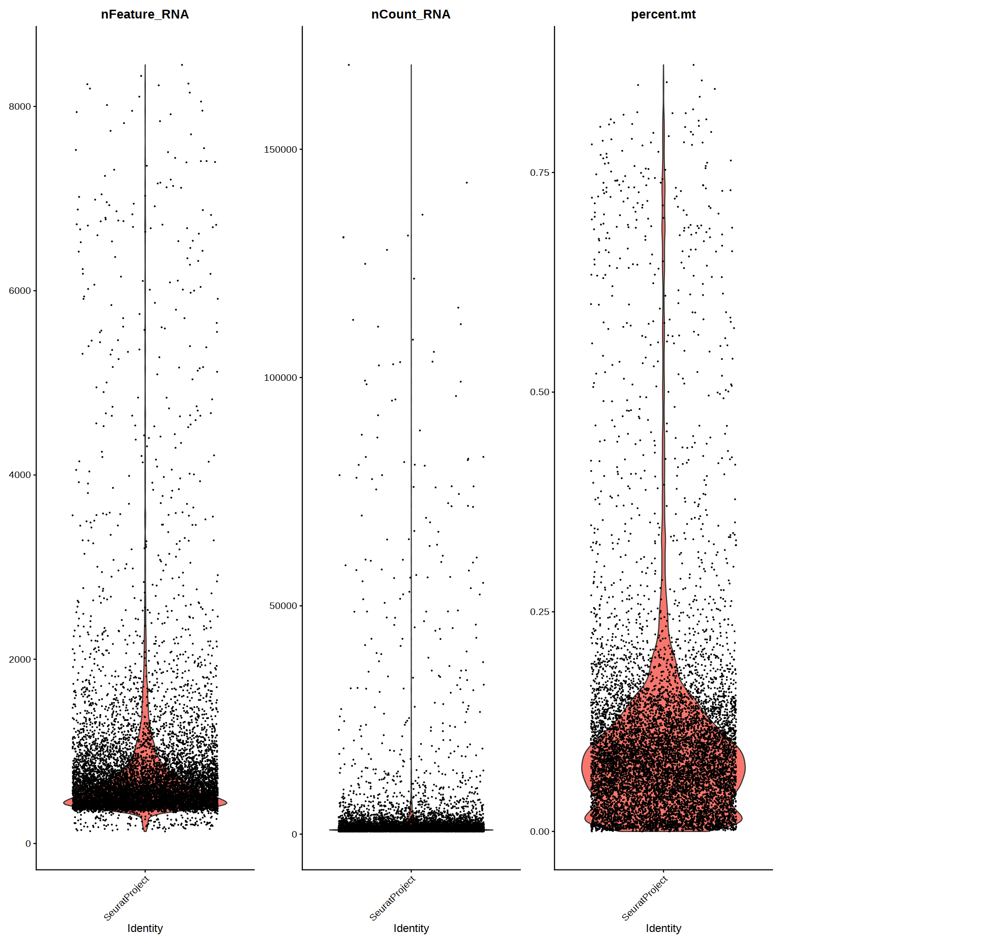

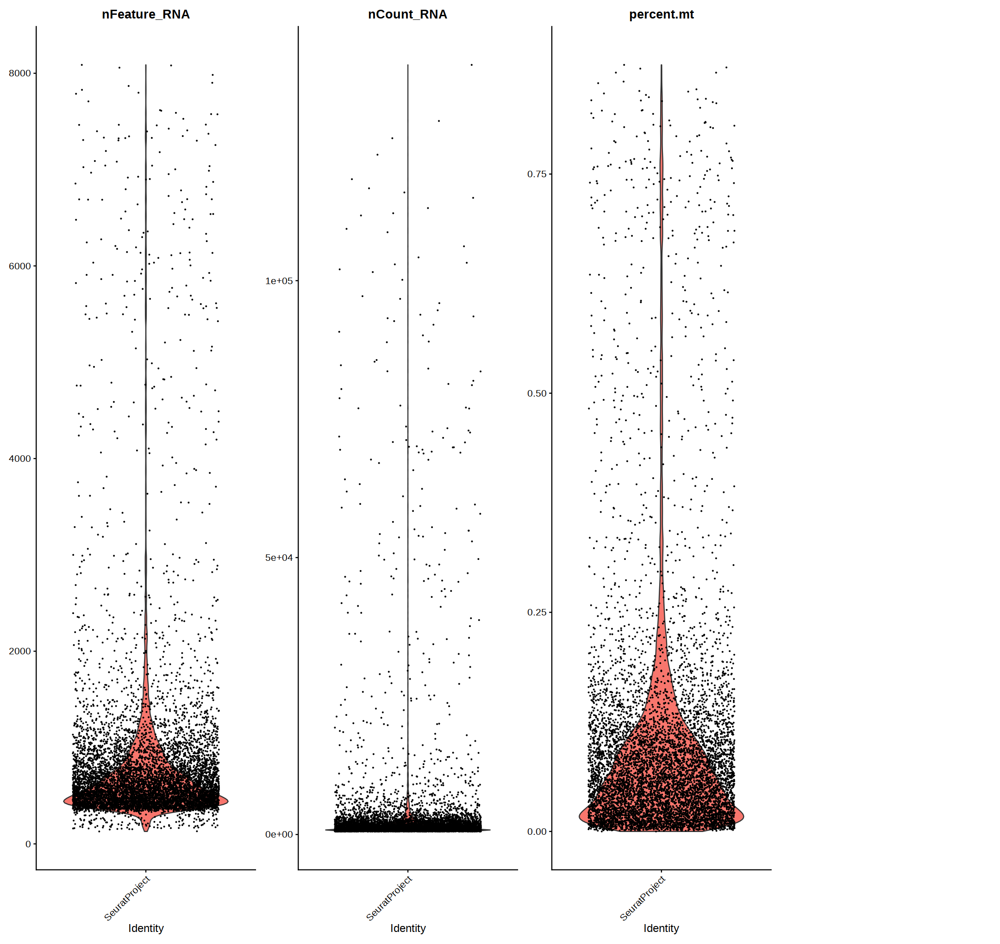

In [15]:
VlnPlot(j11_1, features = c("nFeature_RNA","nCount_RNA","percent.mt"),ncol=4)
VlnPlot(j11_2, features = c("nFeature_RNA","nCount_RNA","percent.mt"),ncol=4)

In [16]:
scatter_j11_1 <- FeatureScatter(j11_1, feature1 = "nCount_RNA", feature2 = "percent.mt")
scatter_j11_2 <- FeatureScatter(j11_2, feature1 = "nCount_RNA", feature2 = "percent.mt")

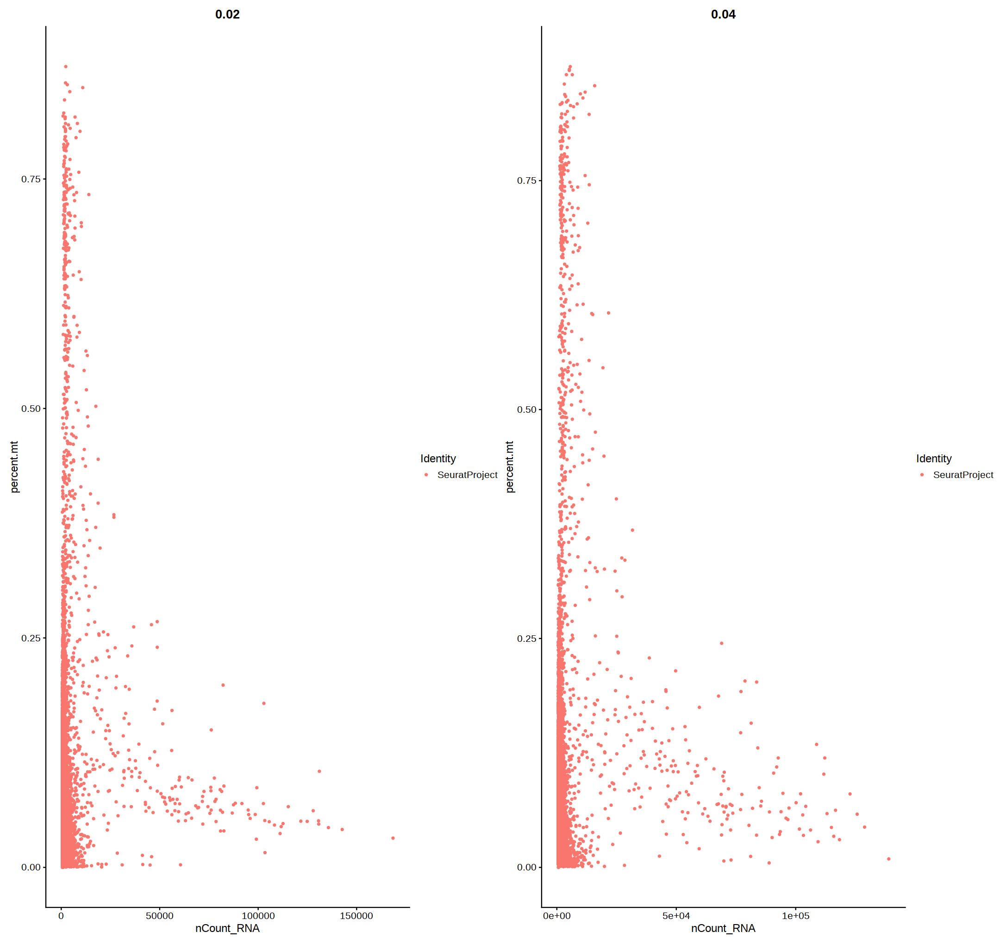

In [17]:
scatter_j11_1 + scatter_j11_2

merging of the different samples

In [18]:
embryo <- merge(x = j11_1, y = j11_2)

Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."


Normalization, selection of varibale feature, scaling, PCA and batch correction

In [19]:
embryo <- NormalizeData(embryo) %>% FindVariableFeatures() %>% ScaleData() %>% RunPCA(verbose = FALSE)
embryo.integrated <- RunHarmony(embryo, group.by.vars = "SAMP", max.iter.harmony = 20)

Centering and scaling data matrix

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony converged after 10 iterations

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.RNA.harmony; see ?make.names for more details on syntax validity"


# Doublet generation with doubletFinder

Generating artifical doublet

Le chargement a nécessité le package : fields

Le chargement a nécessité le package : spam

Warning message:
"le package 'spam' a été compilé avec la version R 4.1.2"
Spam version 2.8-0 (2022-01-05) is loaded.
Type 'help( Spam)' or 'demo( spam)' for a short introduction 
and overview of this package.
Help for individual functions is also obtained by adding the
suffix '.spam' to the function name, e.g. 'help( chol.spam)'.


Attachement du package : 'spam'


L'objet suivant est masqué depuis 'package:AnnotationHub':

    display


L'objet suivant est masqué depuis 'package:stats4':

    mle


Les objets suivants sont masqués depuis 'package:base':

    backsolve, forwardsolve


Le chargement a nécessité le package : viridis

Le chargement a nécessité le package : viridisLite


Try help(fields) to get started.



[1] "Creating artificial doublets for pN = 5%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.001..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 10%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.001..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 15%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.001..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 20%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.001..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 25%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.001..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 30%"
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.001..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."


Le chargement a nécessité le package : KernSmooth

KernSmooth 2.23 loaded
Copyright M. P. Wand 1997-2009

Le chargement a nécessité le package : ROCR



NULL


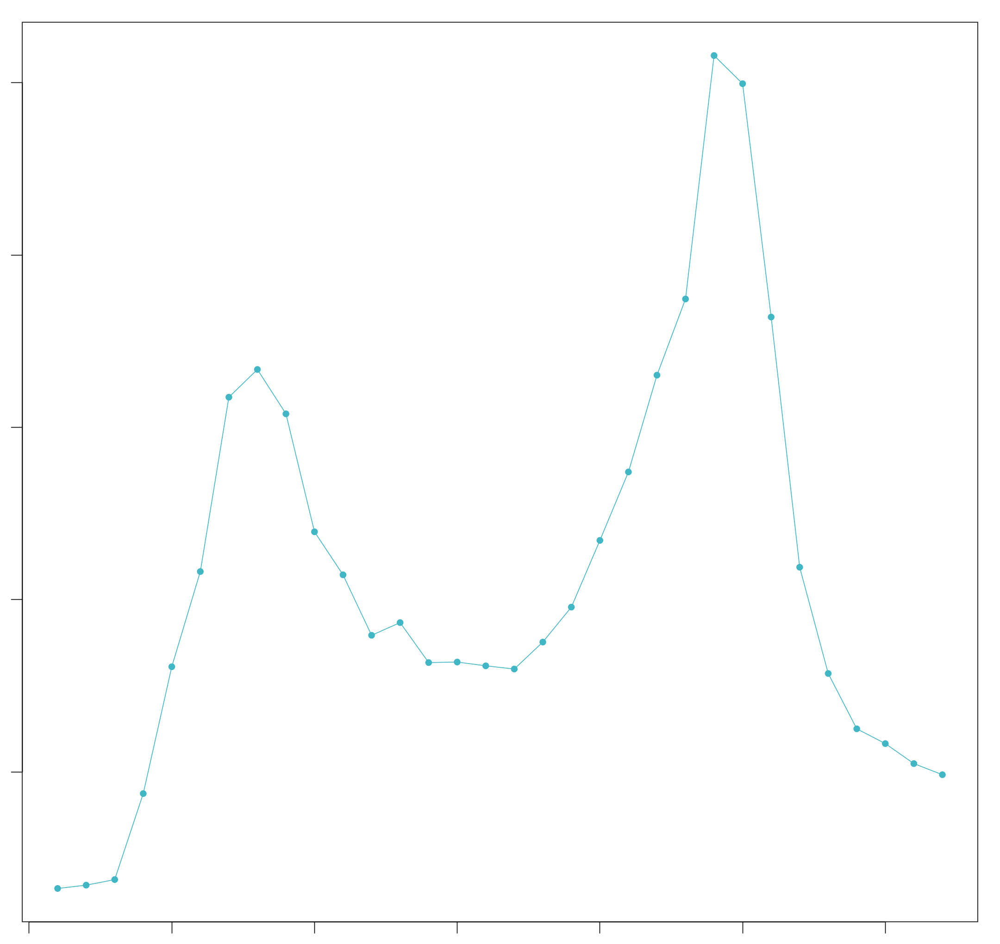

In [20]:
sweep.res.list <- paramSweep_v3(embryo.integrated, PCs = 1:20, sct = FALSE)
sweep.stats <- summarizeSweep(sweep.res.list, GT = FALSE)
bcmvn <- find.pK(sweep.stats)

Add clustering information

In [21]:
annotations <- embryo.integrated@meta.data$seurat.cluster
homotypic.prop <- modelHomotypic(annotations)

Assuming 5% doublet formation rate

In [22]:
nExp_poi <- round(0.05*nrow(embryo.integrated@meta.data))
nExp_poi.adj <- round(nExp_poi*(1-homotypic.prop))

In [23]:
embryo.integrated <- doubletFinder_v3(embryo.integrated, PCs = 1:20, pN = 0.25, pK = 0.09, nExp = nExp_poi, reuse.pANN = FALSE, sct = FALSE)

[1] "Creating 5846 artificial doublets..."
[1] "Creating Seurat object..."
[1] "Normalizing Seurat object..."
[1] "Finding variable genes..."
[1] "Scaling data..."


Centering and scaling data matrix



[1] "Running PCA..."
[1] "Calculating PC distance matrix..."
[1] "Computing pANN..."
[1] "Classifying doublets.."


In [24]:
pann <- grep("pANN", colnames(embryo.integrated@meta.data), value=TRUE)

In [25]:
embryo.integrated <- doubletFinder_v3(embryo.integrated, PCs = 1:20, pN = 0.25, pK = 0.09, nExp = nExp_poi.adj, reuse.pANN = pann, sct = FALSE)

In [26]:
dfclassif <- grep("DF.classifications_", colnames(embryo.integrated@meta.data), value=TRUE)

Visualization fo doublet classification

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
14:41:18 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by 'spam'

14:41:18 Read 17539 rows and found 20 numeric columns

14:41:18 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by 'spam'

14:41:18 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:41:30 Writing NN index file to 

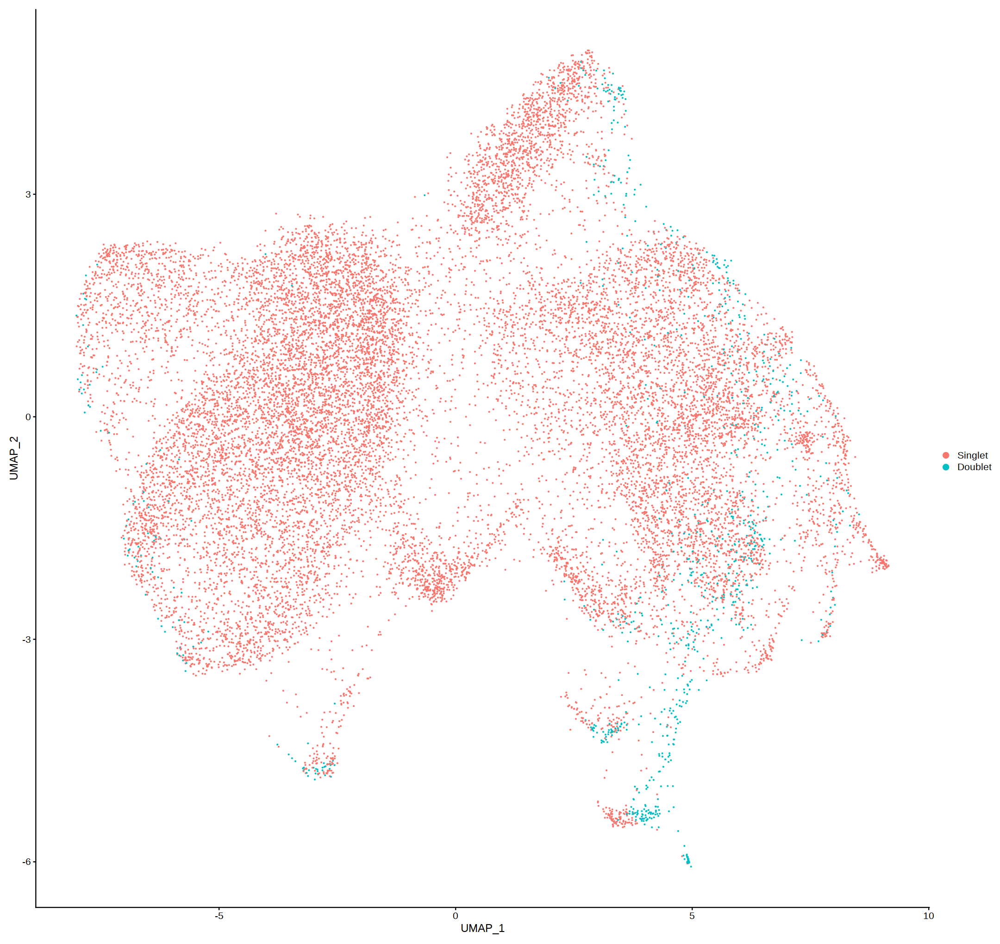

In [27]:
Idents(embryo.integrated) <- dfclassif
embryo.integrated <- RunUMAP(embryo.integrated, dims = 1:20)
DimPlot(embryo.integrated)

Saving plot

In [28]:
plot_umap_doublet_classification <- bind_cols(embryo.integrated@meta.data, as.data.frame(embryo.integrated@reductions$umap@cell.embeddings)) %>%
  ggplot(aes(UMAP_1, UMAP_2, color = get(eval(paste0(dfclassif))))) +
  geom_point(size = 0.2) +
  theme_bw() +
  scale_color_manual(values = c("#c0392b","#3498db")) +
  labs(color = 'Doublet Finder Classification') +
  guides(colour = guide_legend(override.aes = list(size = 2))) +
  theme(legend.position = 'right') +
  coord_fixed() +
  annotate(
    geom = 'text', x = Inf, y = -Inf,
    label = paste0('n = ', format(nrow(embryo.integrated@meta.data), big.mark = ',', trim = TRUE)),
    vjust = -1.5, hjust = 1.25, color = 'black', size = 2.5
  )

ggsave(
  '/home/adufour/work/notebook/plots/J11/dbfinder_J11.png',
  plot_umap_doublet_classification,
  height = 12,
  width = 14
)

Median calculation for plotting

In [29]:
median_nCount <- median(embryo.integrated@meta.data$nCount)
median_nFeature <- median(embryo.integrated@meta.data$nFeature)
median_percent_MT <- median(embryo.integrated@meta.data$percent.mt)

In [30]:
transcript_per_samples <- ggplot(embryo.integrated@meta.data, aes(x = SAMP, y = nCount_RNA, fill = SAMP)) +
  geom_violin(draw_quantiles = c(0.5), scale = 'area', trim = FALSE) +
  geom_hline(yintercept = median_nCount, color = 'black') +
  geom_hline(yintercept = 10000, color = 'red') +
  theme_bw() +
  scale_fill_manual(values = custom_colors$discrete) +
  scale_x_discrete(limits = levels(c("J5-1","J5-2"))) +
  scale_y_log10(labels = scales::comma) +
  labs(title = 'Number of transcripts', subtitle = 'log-scale') +
  theme(
    axis.title = element_blank(),
    panel.grid.major.y = element_blank(),
    panel.grid.minor.y = element_blank(),
    legend.position = 'none'
  ) +
  coord_flip()

genes_by_samples <- ggplot(embryo.integrated@meta.data, aes(x = SAMP, y = nFeature_RNA, fill = SAMP)) +
  geom_violin(draw_quantiles = c(0.5), scale = 'area', trim = FALSE) +
  geom_hline(yintercept = median_nFeature, color = 'black') +
  theme_bw() +
  scale_fill_manual(values = custom_colors$discrete) +
  scale_x_discrete(limits = levels(c("J5-1","J5-2"))) +
  scale_y_log10(labels = scales::comma) +
  labs(title = 'Number of expressed genes', subtitle = 'log-scale') +
  theme(
    axis.title = element_blank(),
    panel.grid.major.y = element_blank(),
    panel.grid.minor.y = element_blank(),
    legend.position = 'none'
  ) +
  coord_flip()

mitonchondrial_per_sample <- ggplot(embryo.integrated@meta.data, aes(x = SAMP, y = percent.mt*100, fill = SAMP)) +
  geom_violin(draw_quantiles = c(0.5), scale = 'area', trim = FALSE) +
  geom_hline(yintercept = median_percent_MT, color = 'black') +
  geom_hline(yintercept = 20, color = 'red') +
  theme_bw() +
  scale_fill_manual(values = custom_colors$discrete) +
  scale_x_discrete(limits = levels(c("J5-1","J5-2"))) +
  scale_y_continuous(labels = scales::percent_format(scale = 1)) +
  labs(title = 'Percent MT transcripts', subtitle = 'linear scale') +
  theme(
    axis.title = element_blank(),
    panel.grid.major.y = element_blank(),
    panel.grid.minor.y = element_blank(),
    legend.position = 'none'
  ) +
  coord_flip()

ggsave(
  '/home/adufour/work/notebook/plots/J11/qc_histogram_nCount_nFeature_percentMT_thresholds_J11.png',
  transcript_per_samples + genes_by_samples + mitonchondrial_per_sample + plot_layout(ncol = 3),
  height = 7, width = 10
)

Filtering data based on quality controls metrics

In [31]:
embryo.integrated <- subset(embryo.integrated, subset = nFeature_RNA > 300 & nCount_RNA < 10000 & percent.mt < 20)

Warning message:
"Transformation introduced infinite values in continuous x-axis"
Warning message:
"Removed 4012 rows containing missing values (geom_point)."


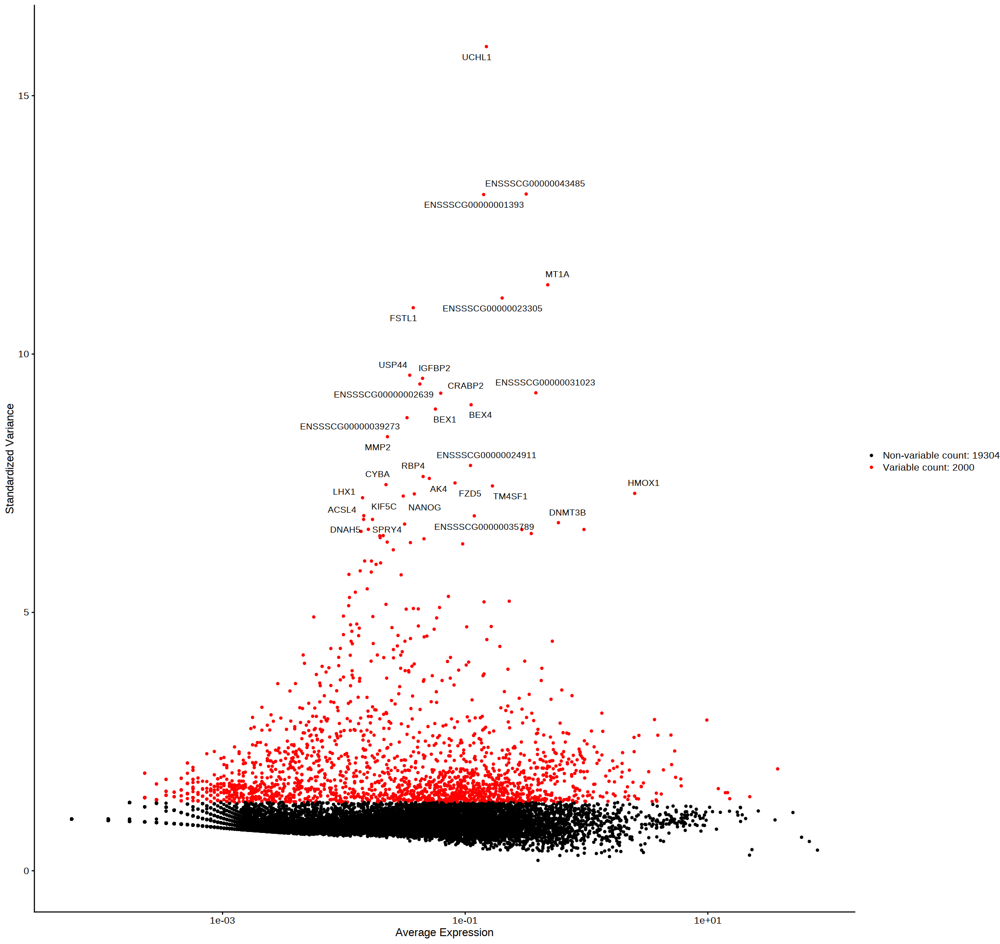

In [32]:
topfeature <- head(VariableFeatures(embryo.integrated), 30)
plotfeature <- VariableFeaturePlot(embryo.integrated)
LabelPoints(plot = plotfeature, points = topfeature, repel = TRUE, xnudge = 0, ynudge = 0, max.overlaps = 30)

In [33]:
embryo.integrated

An object of class Seurat 
21304 features across 16707 samples within 1 assay 
Active assay: RNA (21304 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

# Visualization fo the different principal composant

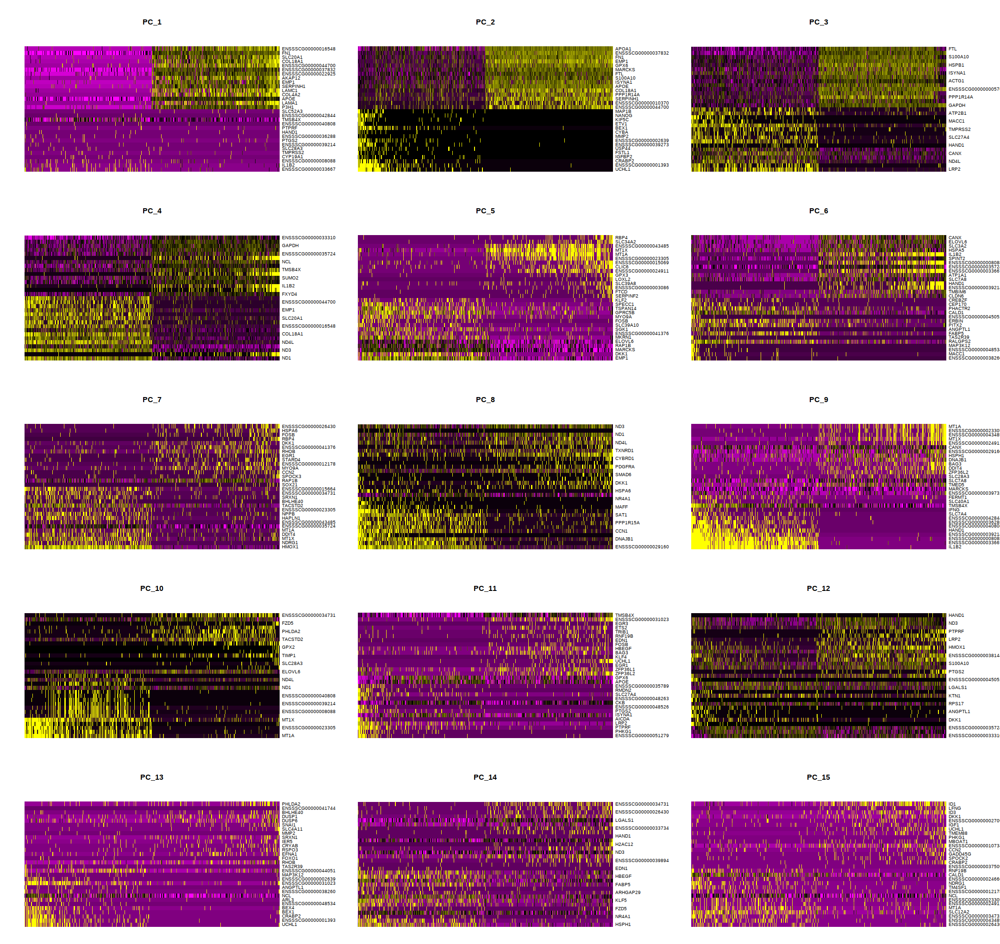

In [34]:
DimHeatmap(embryo.integrated, dims = 1:15, cells = 1000, balanced = TRUE)

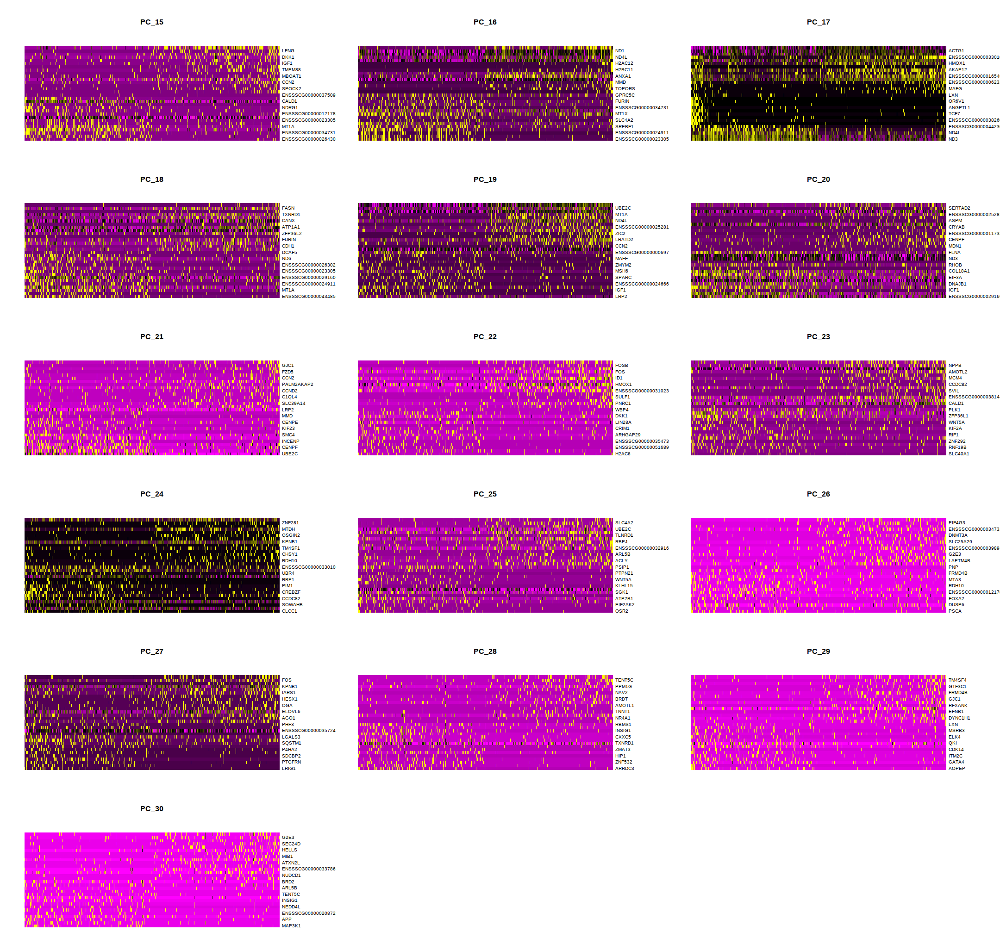

In [35]:
DimHeatmap(embryo.integrated, dims = 15:30, cells = 1000, balanced = TRUE)

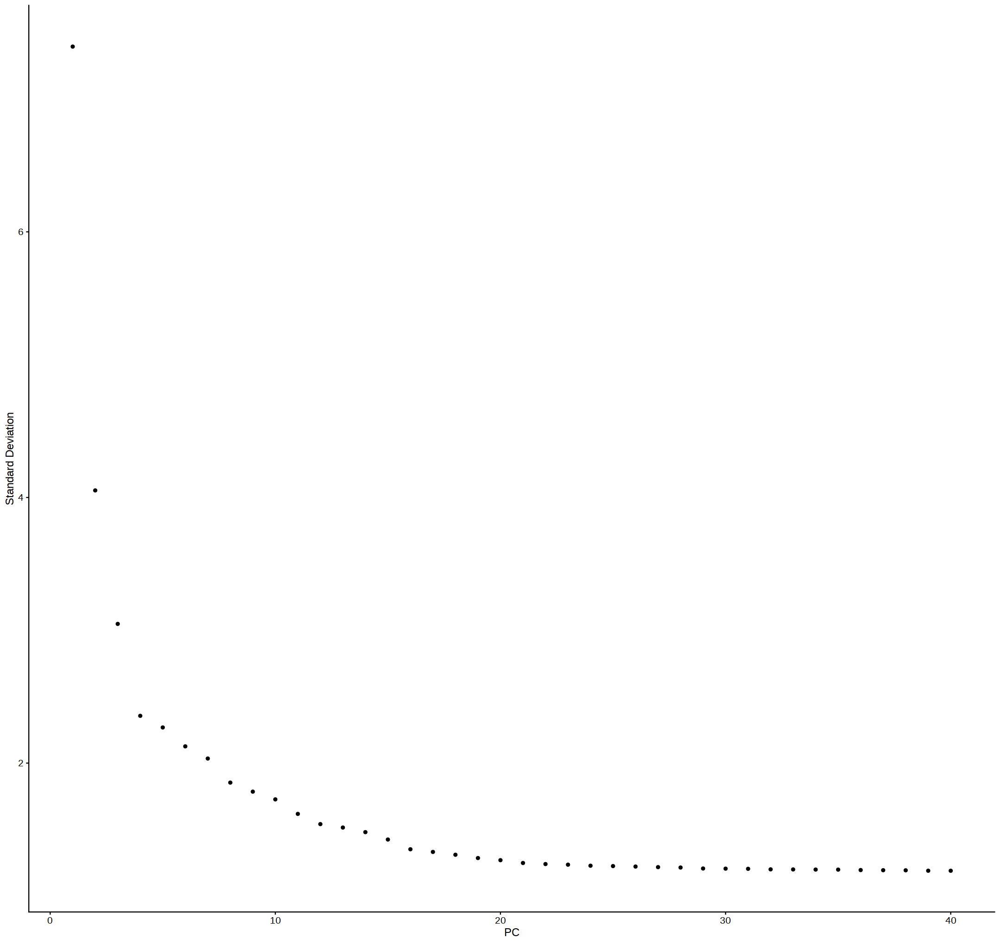

In [36]:
ElbowPlot(embryo.integrated, ndims = 40)

# Vizualization and clustering

In [37]:
embryo.integrated <- RunUMAP(embryo.integrated, reduction = "harmony", dims = 1:20)

14:44:57 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by 'spam'

14:44:58 Read 16707 rows and found 20 numeric columns

14:44:58 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by 'spam'

14:44:58 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:45:08 Writing NN index file to temp file /tmp/Rtmp74onCJ/filea2b53adc91a4

14:45:08 Searching Annoy index using 1 thread, search_k = 3000

14:45:40 Annoy recall = 100%

14:45:45 Commencing smooth kNN distance calibration using 1 thread

14:45:57 Initializing from normalized Laplacian + noise

14:46:00 Commencing opt

In [38]:
embryo.integrated <- FindNeighbors(embryo.integrated, reduction = "harmony", dims = 1:20)

Computing nearest neighbor graph

Computing SNN



In [39]:
embryo.integrated <- FindClusters(embryo.integrated, resolution = 0.1)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16707
Number of edges: 515083

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9471
Number of communities: 6
Elapsed time: 13 seconds


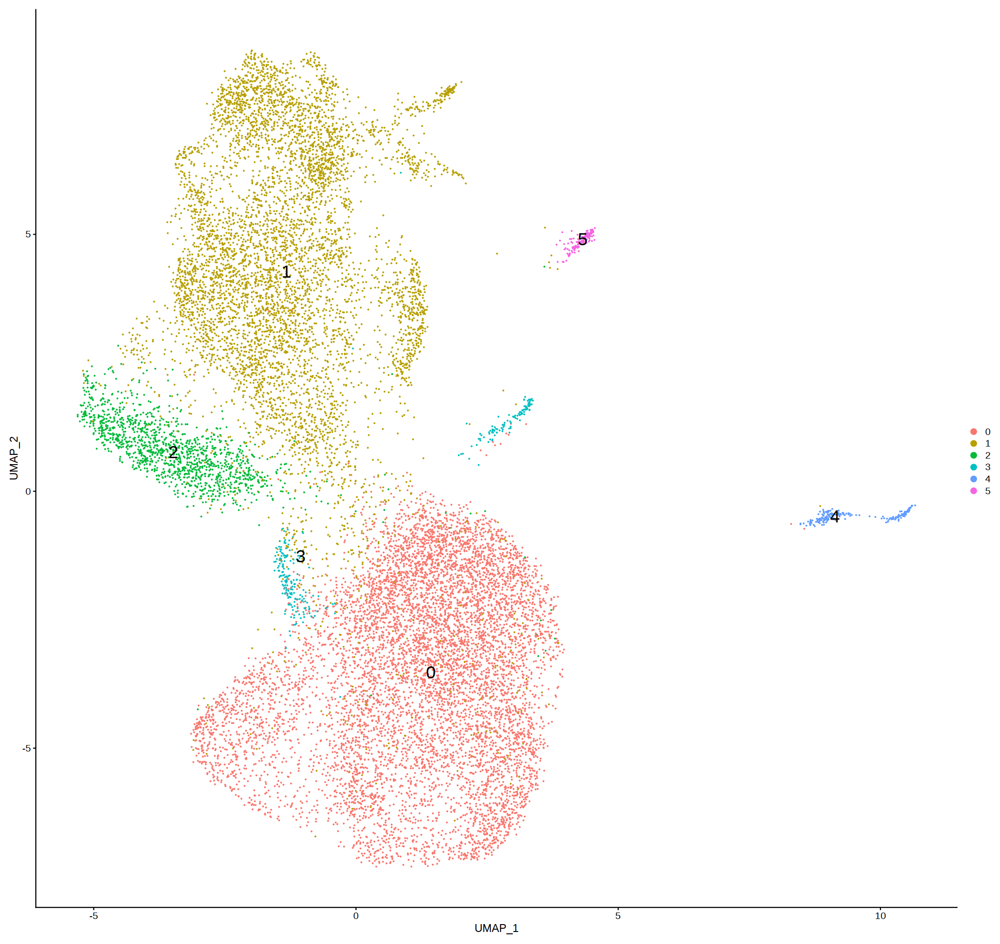

In [40]:
DimPlot(embryo.integrated, reduction = "umap", label = TRUE, label.size = 8)

Vizualization samples

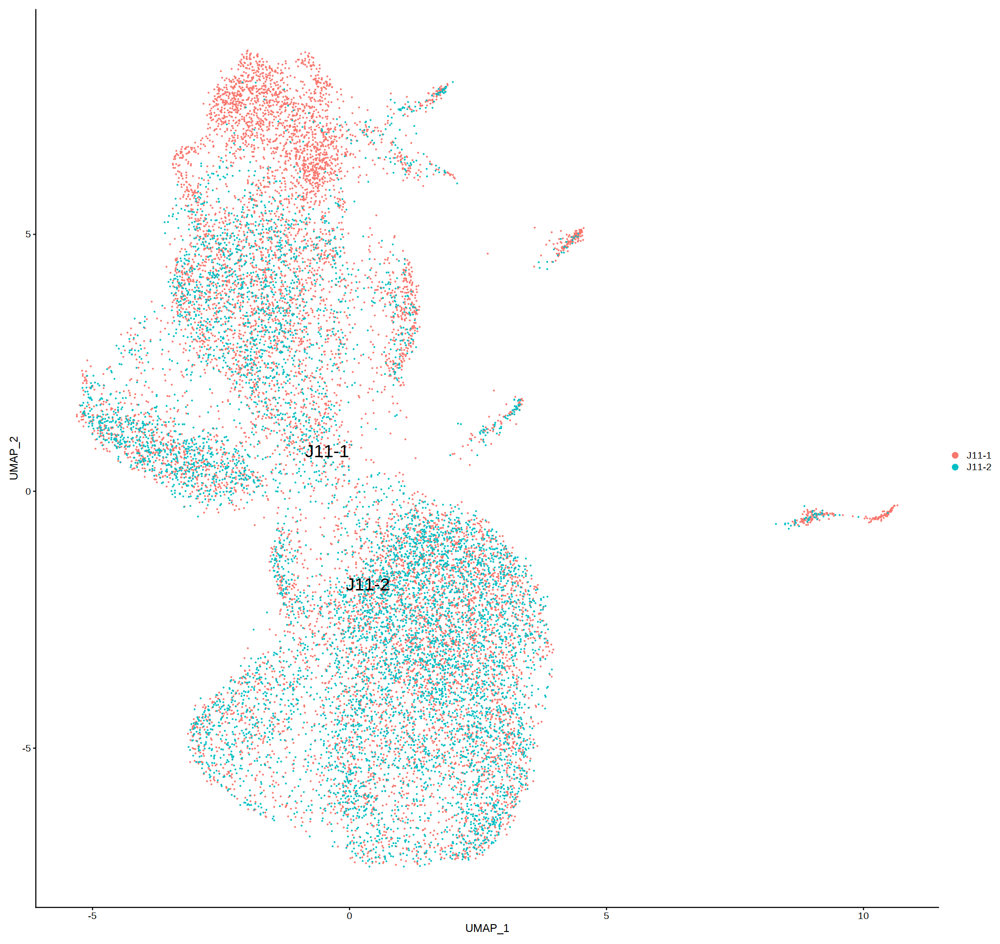

In [41]:
Idents(object = embryo.integrated) <- "SAMP"
DimPlot(embryo.integrated, reduction = "umap", label = TRUE, label.size = 8)

In [42]:
table(embryo.integrated@meta.data$seurat_clusters, embryo.integrated@meta.data$SAMP)

   
    J11-1 J11-2
  0  3850  4330
  1  4547  1975
  2   643   719
  3   144   151
  4   173    40
  5   117    18

# Cell cycle scoring

In [43]:
library(gprofiler2)

In [44]:
s.genes <- gorth(query = cc.genes$s.genes, source_organism = "hsapiens",
target_organism = "sscrofa", numeric_ns = "ENTREZGENE_ACC")$ortholog_name

In [45]:
g2m.genes <- gorth(query = cc.genes$g2m.genes, source_organism = "hsapiens",
target_organism = "sscrofa", numeric_ns = "ENTREZGENE_ACC")$ortholog_name

In [46]:
embryo.integrated <- CellCycleScoring(embryo.integrated, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

Warning message:
"The following features are not present in the object: TACC3, ANP32E, not searching for symbol synonyms"


Visualization

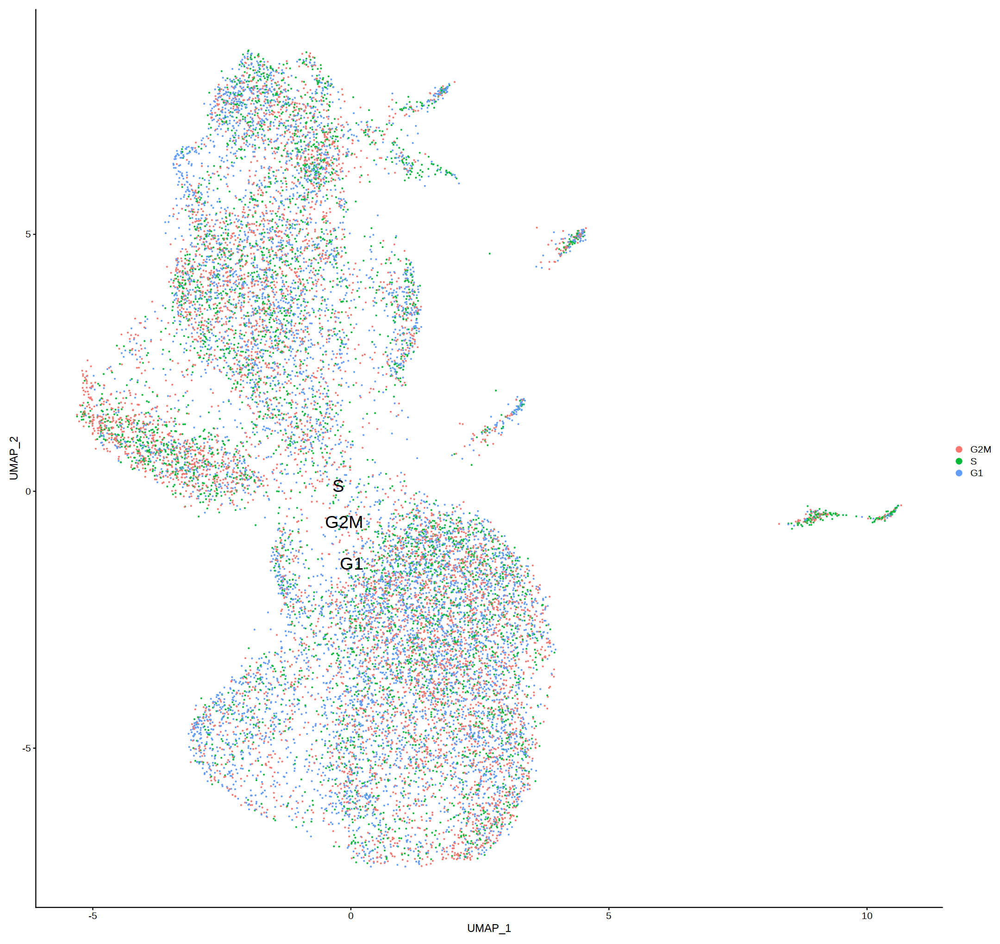

In [47]:
Idents(object = embryo.integrated) <- "Phase"
DimPlot(embryo.integrated, reduction = "umap", label = TRUE, label.size = 8)

In [48]:
embryo.integrated.regress <- ScaleData(embryo.integrated, vars.to.regress = c("S.Score", "G2M.Score"), features = rownames(embryo.integrated))

Regressing out S.Score, G2M.Score

Centering and scaling data matrix



In [49]:
embryo.integrated.regress <-  FindVariableFeatures(embryo.integrated.regress) %>% RunPCA()

PC_ 1 
Positive:  APOA1, FN1, ENSSSCG00000037832, APOE, ENSSSCG00000016548, SLC20A1, EMP1, GPX6, ISYNA1, COL18A1 
	   S100A10, SERPINH1, ENSSSCG00000044700, MARCKS, ENSSSCG00000022925, AKAP12, HSPB1, CLDN6, FST, P3H1 
	   LAMA1, LAMC1, CKB, COL4A2, LAMB1, RALGPS2, GPRC5B, FBLN2, PPP1R14A, FSCN1 
Negative:  HSD17B1, ENSSSCG00000010792, GM2A, TMEM254, ENSSSCG00000017061, ALDH1L2, ENSSSCG00000016284, ENSSSCG00000013260, CYP17A1, RDH16 
	   PSAP, DAB2, ZDHHC18, CSRP2, PRDX5, NPC2, ENSSSCG00000003451, PTGES, SLC37A2, FDX1 
	   RIMKLB, HSD11B2, KRT7, CTSL, IVNS1ABP, ENPP3, EREG, ARL5A, FUCA1, ATP6V1G3 
PC_ 2 
Positive:  ENSSSCG00000016284, PSAP, SLC37A2, CANX, ENSSSCG00000017061, SCD, LRP2, ENSSSCG00000003451, GM2A, ENSSSCG00000013260 
	   RDH16, DSP, ATP2A2, ENPP3, CYP17A1, ENSSSCG00000010792, ALDH1L2, EREG, DSC2, TMEM254 
	   CTSD, B4GALT5, NEU1, CTSL, ACTN1, IVNS1ABP, ENSSSCG00000014272, LAMP2, LGMN, PTGES 
Negative:  APOA1, S100A10, CKB, HSPB1, ISYNA1, GPX6, APOE, PPP1R14A, ENSSSCG000000

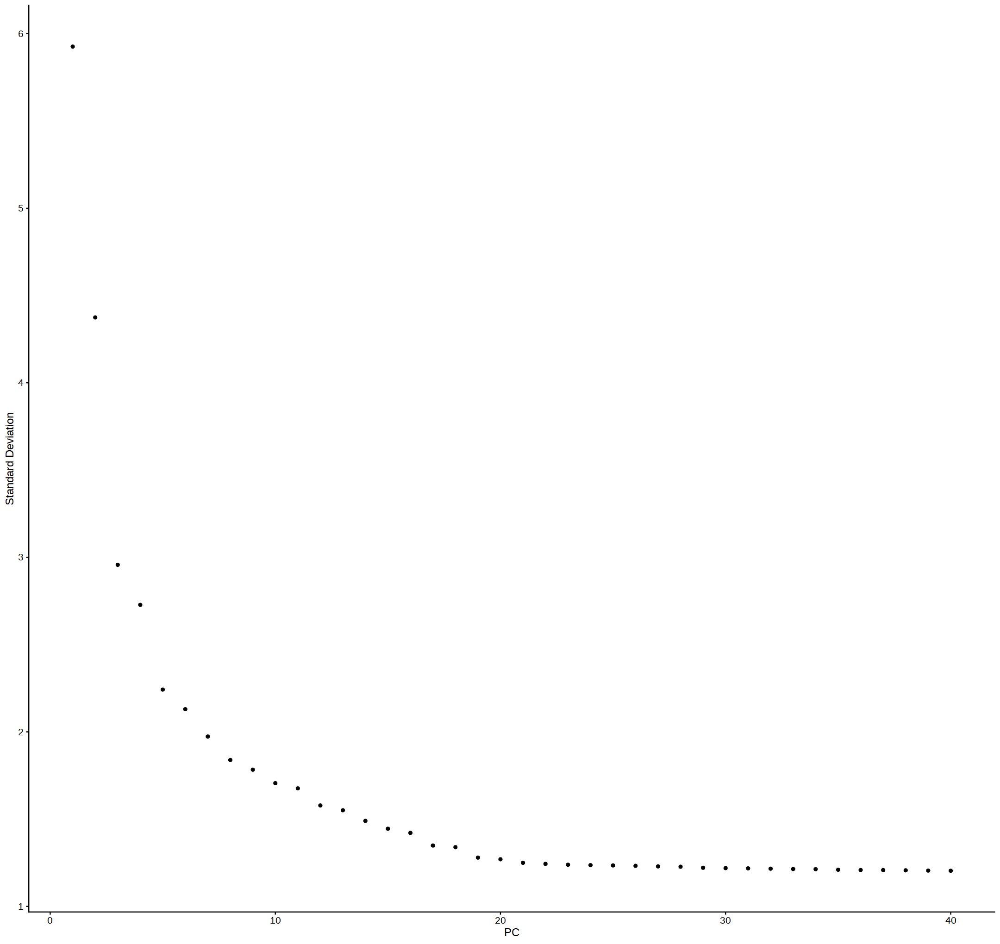

In [50]:
ElbowPlot(embryo.integrated.regress, ndims = 40)

In [51]:
embryo.integrated.regress <- RunUMAP(embryo.integrated.regress, reduction = "harmony", dims = 1:20)

16:45:54 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by 'spam'

16:45:54 Read 16707 rows and found 20 numeric columns

16:45:54 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by 'spam'

16:45:54 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:46:01 Writing NN index file to temp file /tmp/Rtmp74onCJ/filea2b55e8d07bf

16:46:01 Searching Annoy index using 1 thread, search_k = 3000

16:46:21 Annoy recall = 100%

16:46:25 Commencing smooth kNN distance calibration using 1 thread

16:46:33 Initializing from normalized Laplacian + noise

16:46:35 Commencing opt

In [52]:
embryo.integrated.regress <- FindNeighbors(embryo.integrated.regress, reduction = "harmony", dims = 1:20)

Computing nearest neighbor graph

Computing SNN



In [53]:
embryo.integrated.regress <- FindClusters(embryo.integrated.regress, resolution = 0.1)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16707
Number of edges: 515083

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9471
Number of communities: 6
Elapsed time: 8 seconds


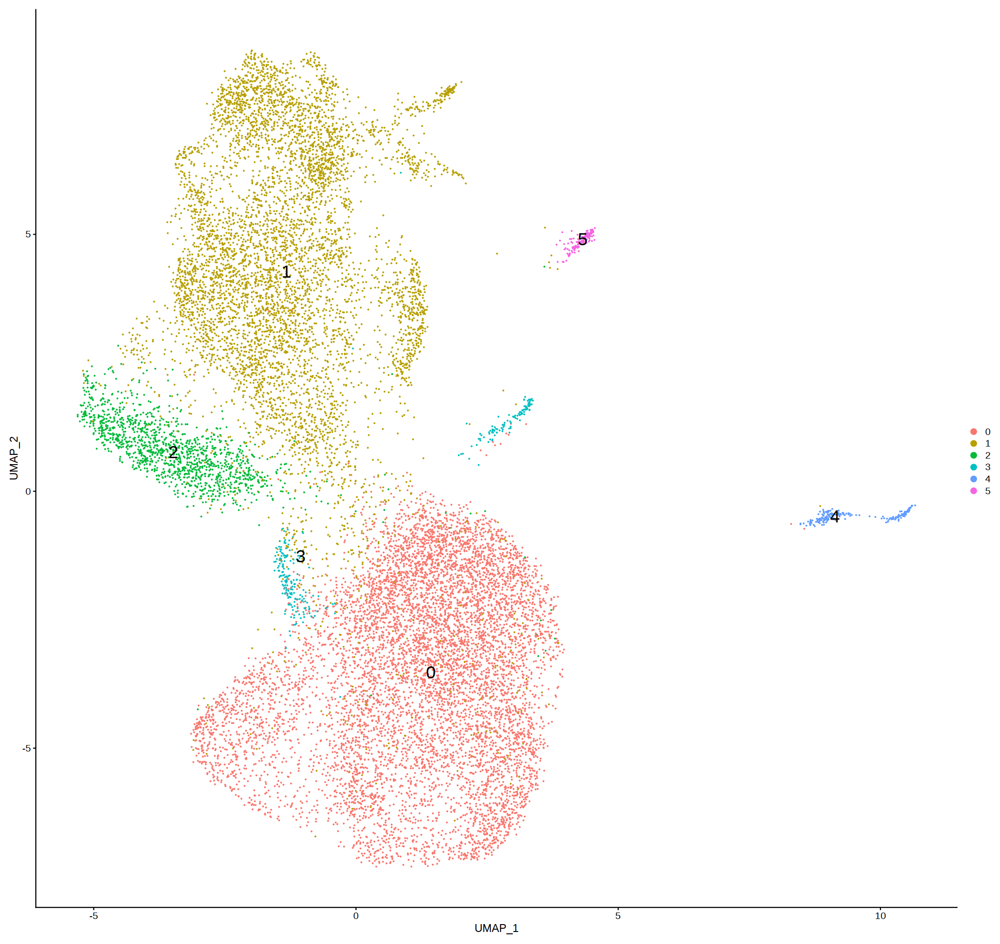

In [54]:
Idents(object = embryo.integrated.regress) <- "seurat_clusters"
DimPlot(embryo.integrated.regress, reduction = "umap", label = TRUE, label.size = 8)

In [55]:
saveRDS(embryo.integrated, "/home/adufour/work/rds_storage/embryo.j11.rds")
saveRDS(embryo.integrated.regress, "/home/adufour/work/rds_storage/embryo.j11_ccregress.rds")